In [1]:
import cv2 # OpenCV library
import numpy as np # Numpy library for scientific computing
import matplotlib.pyplot as plt # Matplotlib library for plotting

# using command "pip install -U scikit-learn scipy matplotlib"
from sklearn.cluster import KMeans
from sklearn import metrics


In [2]:
# Defines
MAZE_FILE_NAME = "../Maze.png"
ROBOT_FILE_NAME = "../Robot.png"
IMAGE_LADYBUG_FILE_NAME = '../Ladybug_small.png'
MAP_FILE_NAME = "../MapBuilt.txt"

def processCorner(cornerImg_hsv,lowerColour, upperColour):
    kernel = np.ones((2,2), np.uint8)
    kernelOpen = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(100,100))
    kernelClose = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(20,20))
    erodeIterations = 1
    dilateIterations = 1
    openIterations = 10
    closeIterations = 1
    corner_mask = cv2.inRange(cornerImg_hsv, lowerColour, upperColour)
    corner_mask = cv2.erode(corner_mask, kernel, iterations = erodeIterations)
#     corner_mask = cv2.dilate(corner_mask, kernel, iterations = dilateIterations)
    opening = cv2.morphologyEx(corner_mask, cv2.MORPH_OPEN, kernelOpen, iterations = openIterations)
    corner_mask = cv2.morphologyEx(corner_mask, cv2.MORPH_CLOSE, kernelClose, iterations = closeIterations)
    return corner_mask

def checkCorner(cornerMask):
    height = 375
    width = 337
    heightIndex = 0
    widthIndex = 0
    counter = 0
    cornerW = []
    cornerH = []
    while heightIndex < height:
        widthIndex = 0
        while widthIndex < width:
            if cornerMask[heightIndex][widthIndex] > 0:
                cornerH.append(heightIndex)
                cornerW.append(widthIndex)
                counter += 1
            widthIndex += 1
        heightIndex += 1 
    return counter, cornerH, cornerW

def cornerCentre(cornerH,cornerW):
    corner = np.array(list(zip(cornerH, cornerW))).reshape(len(cornerH), 2)
    kmeans_model = KMeans(1)
    K = 1
    kmeans_model = KMeans(n_clusters=K).fit(corner)
    cornerCenters = np.array(kmeans_model.cluster_centers_)
    return cornerCenters

def wallExists(wallMask):
    wallExists = 0
    wallCounter = 0
    spaceCounter = 0
    i = 0
    while i < len(wallMask):
        j = 0
        while j < len(wallMask[0]):
            
            if wallMask[i][j] > 0:
                wallCounter += 1 
            if wallMask[i][j] == 0:
                spaceCounter += 1
                
            j += 1
        i += 1

    if wallCounter > 500:
        wallExists = 1
    else:
        wallExists = 0
    
    return wallExists

TASK 1: Read in Images and Display the Maze in RGB Mode

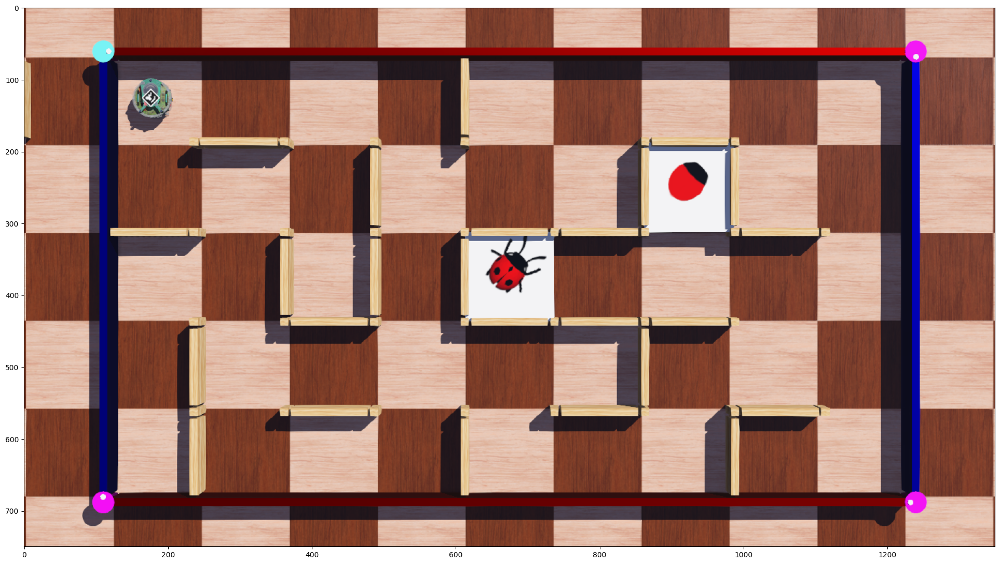

In [3]:
# READ IN BGR IMAGE
img = cv2.imread(MAZE_FILE_NAME)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # OpenCV reads an image in the BGR order by default, this function can change the order to RGB
plt.figure(figsize = (75, 13.5))
plt.imshow(img_rgb)
plt.show()

robotImg = cv2.imread(ROBOT_FILE_NAME)
robotRGB = cv2.cvtColor(robotImg, cv2.COLOR_BGR2RGB)

TASK 2: Find 4 cornerstones of the maze

A: 111 62 cyan
B: 1239 62 pink
C: 111 688 pink
D: 1239 688 pink


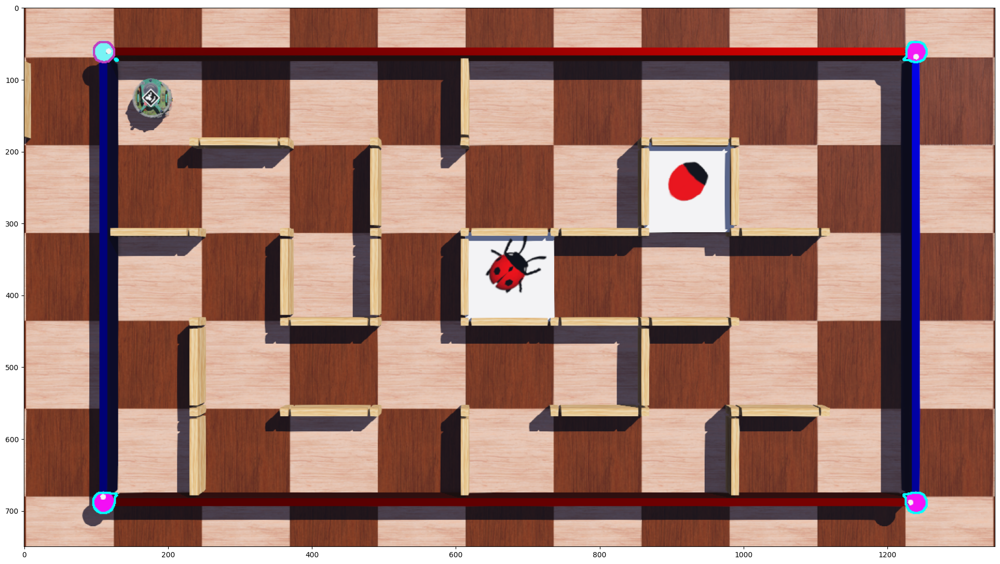

In [4]:
cornerROIA = img_rgb[0:375, 0:337]
cornerROIB = img_rgb[0:375, 1012:1350]
cornerROIC = img_rgb[375:750, 0:337]
cornerROID = img_rgb[375:750, 1012:1350]

# CONVERT BGR IMAGE TO HSV
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cornerROIA_hsv = img_hsv[0:375, 0:337]
cornerROIB_hsv = img_hsv[0:375, 1012:1350]
cornerROIC_hsv = img_hsv[375:750, 0:337]
cornerROID_hsv = img_hsv[375:750, 1012:1350]

lowerPink = np.array([145, 170, 0])
upperPink = np.array([155, 255, 255])
lowerCyan = np.array([85, 110, 0])
upperCyan = np.array([95, 140, 255])

rCyan = 0
gCyan = 255
bCyan = 255
rPink = 191
gPink = 64
bPink = 191

# Threshold, erode, open, and finally close to find any PINK cornerstones in the A section
cornerA_mask = processCorner(cornerROIA_hsv,lowerPink,upperPink)
# Detect the edges of the processed PINK cornerstone mask
edges = cv2.Canny(cornerA_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the PINK cornerstone
img2, contoursAPink, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of A section
cv2.drawContours(cornerROIA, contoursAPink, -1, (rCyan, gCyan, bCyan), 2)
# Obtain the number of pixels in the PINK mask and the Y and X coordinates of said pixels
counterAPink, cornerAPinkH, cornerAPinkW = checkCorner(cornerA_mask)
# Threshold, erode, open, and finally close to find any CYAN cornerstones in the A section
cornerA_mask = processCorner(cornerROIA_hsv,lowerCyan,upperCyan)
# Detect the edges of the processed CYAN cornerstone mask
edges = cv2.Canny(cornerA_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the CYAN cornerstone
img2, contoursACyan, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of A section
cv2.drawContours(cornerROIA, contoursACyan, -1, (rPink, gPink, bPink), 2)
# Obtain the number of pixels in the CYAN mask and the Y and X coordinates of said pixels
counterACyan, cornerACyanH, cornerACyanW = checkCorner(cornerA_mask)
# Check if there are more pixels in either the PINK or CYAN masks to determine with cornerstone is in A section
if counterAPink > counterACyan:
    # Set the colour of the A section cornerstone to PINK
    colour = 'pink'
    # Obtain the centroid of the PINK mask cluster, and therefore the centre of the cornerstone
    cornerCentersA = cornerCentre(cornerAPinkH,cornerAPinkW)
if counterACyan > counterAPink:
    # Set the colour of the A section cornerstone to CYAN
    colour = 'cyan'
    # Obtain the centroid of the CYAN mask cluster, and therefore the centre of the cornerstone
    cornerCentersA = cornerCentre(cornerACyanH,cornerACyanW)
cornerCentersA_global = []
cornerCentersA_global.append(round(cornerCentersA[0][1]) + 0) # y
cornerCentersA_global.append(round(cornerCentersA[0][0]) + 0) # x
cornerCentersA_global.append(colour)

# Threshold, erode, open, and finally close to find any PINK cornerstones in the B section
cornerB_mask = processCorner(cornerROIB_hsv,lowerPink,upperPink)
# Detect the edges of the processed PINK cornerstone mask
edges = cv2.Canny(cornerB_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the PINK cornerstone
img2, contoursBPink, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of B section
cv2.drawContours(cornerROIB, contoursBPink, -1, (rCyan, gCyan, bCyan), 2)
# Obtain the number of pixels in the PINK mask and the Y and X coordinates of said pixels
counterBPink, cornerBPinkH, cornerBPinkW = checkCorner(cornerB_mask)
# Set the colour of the B section cornerstone to PINK
colour = 'pink'
# Obtain the centroid of the PINK mask cluster, and therefore the centre of the cornerstone
cornerCentersB = cornerCentre(cornerBPinkH,cornerBPinkW)
cornerCentersB_global = []
cornerCentersB_global.append(round(cornerCentersB[0][1]) + 1012) # y
cornerCentersB_global.append(round(cornerCentersB[0][0]) + 0) # x
cornerCentersB_global.append(colour)

# Threshold, erode, open, and finally close to find any PINK cornerstones in the C section
cornerC_mask = processCorner(cornerROIC_hsv,lowerPink,upperPink)
# Detect the edges of the processed PINK cornerstone mask
edges = cv2.Canny(cornerC_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the PINK cornerstone
img2, contoursCPink, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of C section
cv2.drawContours(cornerROIC, contoursCPink, -1, (rCyan, gCyan, bCyan), 2)
# Obtain the number of pixels in the PINK mask and the Y and X coordinates of said pixels
counterCPink, cornerCPinkH, cornerCPinkW = checkCorner(cornerC_mask)
# Set the colour of the C section cornerstone to PINK
colour = 'pink'
# Obtain the centroid of the PINK mask cluster, and therefore the centre of the cornerstone
cornerCentersC = cornerCentre(cornerCPinkH,cornerCPinkW)
cornerCentersC_global = []
cornerCentersC_global.append(round(cornerCentersC[0][1]) + 0) # y
cornerCentersC_global.append(round(cornerCentersC[0][0]) + 375) # x
cornerCentersC_global.append(colour)

# Threshold, erode, open, and finally close to find any PINK cornerstones in the D section
cornerD_mask = processCorner(cornerROID_hsv,lowerPink,upperPink)
# Detect the edges of the processed PINK cornerstone mask
edges = cv2.Canny(cornerD_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the PINK cornerstone
img2, contoursDPink, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of D section
cv2.drawContours(cornerROID, contoursDPink, -1, (rCyan, gCyan, bCyan), 2)
# Obtain the number of pixels in the PINK mask and the Y and X coordinates of said pixels
counterDPink, cornerDPinkH, cornerDPinkW = checkCorner(cornerD_mask)
# Threshold, erode, open, and finally close to find any CYAN cornerstones in the D section
cornerD_mask = processCorner(cornerROID_hsv,lowerCyan,upperCyan)
# Detect the edges of the processed CYAN cornerstone mask
edges = cv2.Canny(cornerD_mask, threshold1 = 50, threshold2 = 100, apertureSize = 3)
# Detect the contour of the edge of the CYAN cornerstone
img2, contoursDCyan, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# Draw the contour onto the original RGB image of D section
cv2.drawContours(cornerROID, contoursDCyan, -1, (rPink, gPink, bPink), 2)
# Obtain the number of pixels in the CYAN mask and the Y and X coordinates of said pixels
counterDCyan, cornerDCyanH, cornerDCyanW = checkCorner(cornerD_mask)
if counterDPink > counterDCyan:
    # Set the colour of the D section cornerstone to PINK
    colour = 'pink'
    # Obtain the centroid of the PINK mask cluster, and therefore the centre of the cornerstone
    cornerCentersD = cornerCentre(cornerDPinkH,cornerDPinkW)
if counterDCyan > counterDPink:
    # Set the colour of the D section cornerstone to CYAN
    colour = 'cyan'
    # Obtain the centroid of the CYAN mask cluster, and therefore the centre of the cornerstone
    cornerCentersD = cornerCentre(cornerDCyanH,cornerDCyanW) 
cornerCentersD_global = []
cornerCentersD_global.append(round(cornerCentersD[0][1]) + 1012) # y
cornerCentersD_global.append(round(cornerCentersD[0][0]) + 375) # x
cornerCentersD_global.append(colour)

# USE CLUSTER CENTRES TO PLOT CIRCLE
print('A:',cornerCentersA_global[0],cornerCentersA_global[1],cornerCentersA_global[2])
print('B:',cornerCentersB_global[0],cornerCentersB_global[1],cornerCentersB_global[2])
print('C:',cornerCentersC_global[0],cornerCentersC_global[1],cornerCentersC_global[2])
print('D:',cornerCentersD_global[0],cornerCentersD_global[1],cornerCentersD_global[2])
rA = rB = rC = rD = 0
gA = gB = gC = gD = 255
bA = bB = bC = bD = 255
if cornerCentersA_global[2] == 'cyan':
    rA = 191
    gA = 64
    bA = 191
if cornerCentersD_global[2] == 'cyan':
    rD = 191
    gD = 64
    bD = 191
plt.figure(figsize = (75, 13.5))
plt.imshow(img_rgb)
plt.show()


TASK 3: Perform Perspective Transform

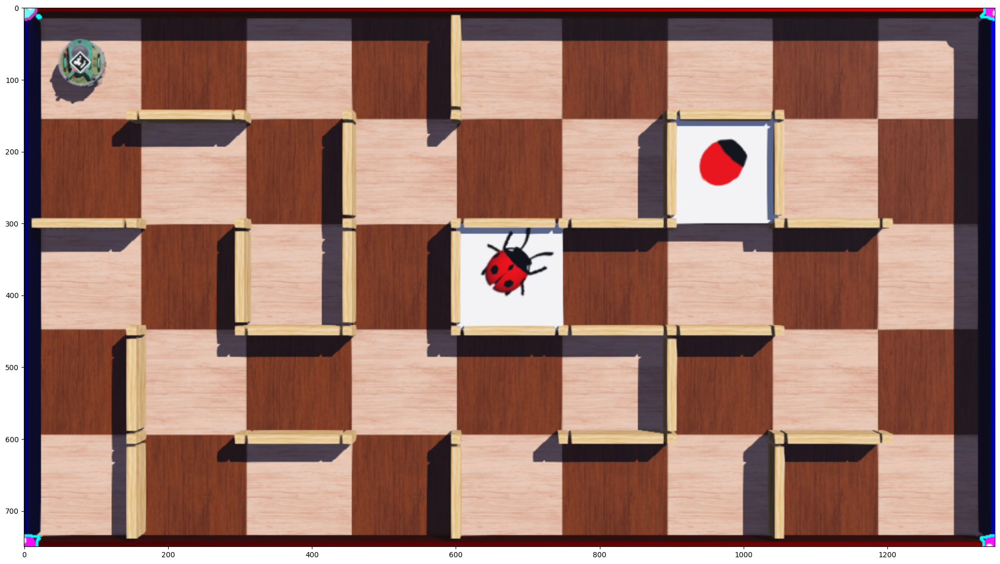

In [5]:
# PERSPECTIVE TRANSFORM
# Points from first image
corners = []
corners.append(cornerCentersA_global[0:2])
corners.append(cornerCentersB_global[0:2])
corners.append(cornerCentersC_global[0:2])
corners.append(cornerCentersD_global[0:2])
corners1 = np.float32(corners)
if cornerCentersA_global[2] == 'cyan':
    flipMap = 0
    # Points on second image
    corners2 = np.float32([[0,0],[1350,0],[0,750],[1350,750]])
    # Homography matrix
    H_Matrix = cv2.getPerspectiveTransform(corners1, corners2)
    #
    dst = cv2.warpPerspective(img_rgb, H_Matrix, (1350, 750))
if cornerCentersD_global[2] == 'cyan':
    flipMap = 1
    # Points on second image
    corners2 = np.float32([[1350,750],[0,750],[1350,0],[0,0]])
    # Homography matrix
    H_Matrix = cv2.getPerspectiveTransform(corners1, corners2)
    #
    dst = cv2.warpPerspective(img_rgb, H_Matrix, (1350, 750))

#### If this image is incorrect, please replace it with the correct one and call it 'dst' so the rest of the program
#### will work

plt.figure(figsize = (75, 13.5))
plt.imshow(dst)
plt.show()

TASK 4: Detect Inner Walls

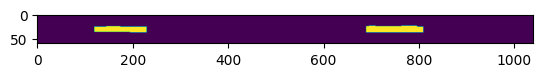

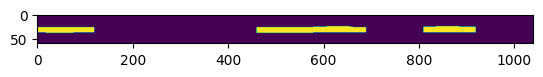

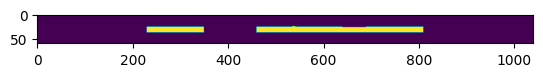

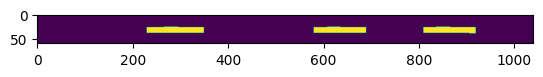

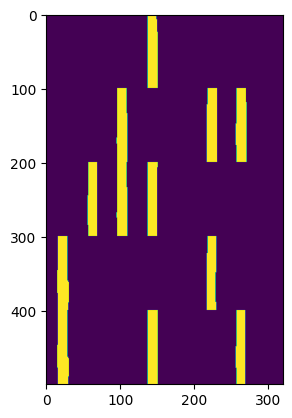

Horizontal Walls
[[1 1 1 1 1 1 1 1 1]
 [0 1 0 0 0 0 1 0 0]
 [1 0 0 0 1 1 0 1 0]
 [0 0 1 0 1 1 1 0 0]
 [0 0 1 0 0 1 0 1 0]
 [1 1 1 1 1 1 1 1 1]]
Vertical Walls
[[1 0 0 0 1 0 0 0 0 1]
 [1 0 0 1 0 0 1 1 0 1]
 [1 0 1 1 1 0 0 0 0 1]
 [1 1 0 0 0 0 1 0 0 1]
 [1 1 0 0 1 0 0 1 0 1]]


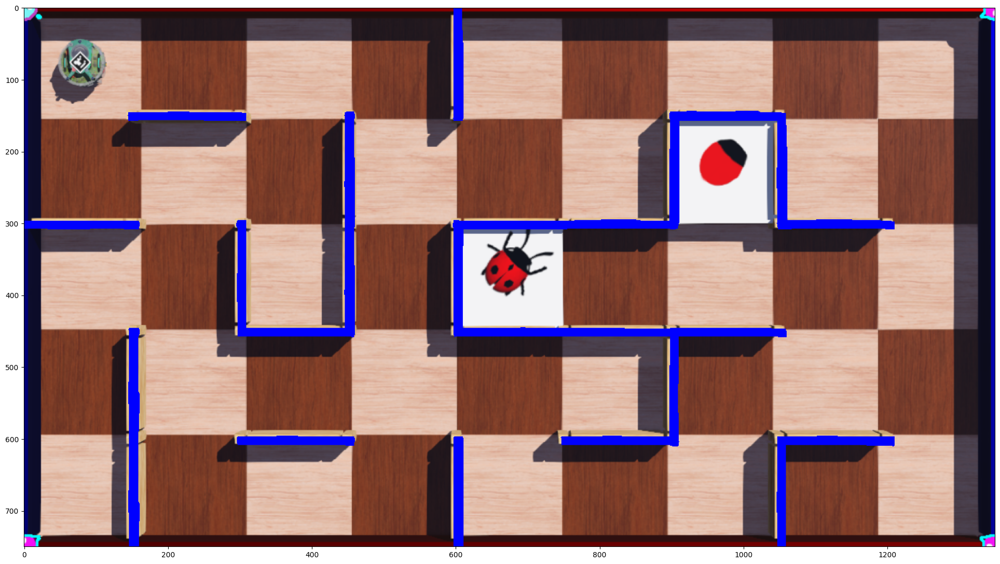

In [6]:
# Convert RGB PERSPECTIVE TRANSFORMED maze image to BGR then HSV and then GRAY
dst_bgr = cv2.cvtColor(dst, cv2.COLOR_RGB2BGR)
dst_hsv = cv2.cvtColor(dst, cv2.COLOR_BGR2HSV)
dst_grey = cv2.cvtColor(dst, cv2.COLOR_RGB2GRAY)

# Threshold the HSV maze image to obtain a mask of the tops of the walls
lower = np.array([90, 50, 220])
upper = np.array([105, 140, 245])
wallMask = cv2.inRange(dst_hsv, lower, upper)
# Process this mask to ensure only the walls remain
kernel = np.ones((4,4), np.uint8)
wallMask = cv2.erode(wallMask, kernel, iterations=2)
wallMask = cv2.dilate(wallMask, kernel, iterations=2)

dst_wallMask = cv2.bitwise_and(dst, dst, mask=wallMask)

# Detect the edges of the wall mask
low_threshold = 50
high_threshold = 150
edges = cv2.Canny(dst_wallMask, low_threshold, high_threshold)
# Fill the edges of the wall mask to obtain solid lines where the walls are
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(40,40))
wallEdgeFill = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

invWallEdgeFill = cv2.bitwise_not(wallEdgeFill)
wallEdgeFill_rgb = cv2.cvtColor(wallEdgeFill, cv2.COLOR_GRAY2RGB)
dst_wallEdgeFill = cv2.bitwise_and(dst, dst, mask=wallEdgeFill)
invWallEdgeFill_rgb = cv2.cvtColor(invWallEdgeFill, cv2.COLOR_GRAY2RGB)
dst_invWallEdgeFill = cv2.bitwise_and(dst, dst, mask=invWallEdgeFill)

height = len(wallEdgeFill_rgb)
width = len(wallEdgeFill_rgb[0])
depth = len(wallEdgeFill_rgb[0][0])-1
heightIndex = 0
widthIndex = 0
depthIndex = 0
while heightIndex < height:
    widthIndex = 0
    while widthIndex < width:
        depthIndex = 0
        while depthIndex < depth:
            wallEdgeFill_rgb[heightIndex][widthIndex][depthIndex] = 0
            depthIndex += 1
        widthIndex += 1
    heightIndex += 1 

alpha = 1
beta = 1
dstEdgeFillWallMask_rgb = cv2.addWeighted(dst_invWallEdgeFill, alpha, wallEdgeFill_rgb, beta, 0.0)

##### SET UP IMAGE DIVISIONS FOR EACH POTENTIAL INTRNAL WALL POSITION
# p.s. I know this section is painful to read but I did not have time to optimise it lol sorry!

# Define Horizontal Wall Limits for each potential wall position
yLimsH = [0]*(4)
yLimsH[0] = [120,180] # first row is at y = 150
yLimsH[1] = [270,330] # first row is at y = 300
yLimsH[2] = [420,480] # first row is at y = 450
yLimsH[3] = [570,630] # first row is at y = 600
xLimsH = [0]*(9)
xLimsH[0] = [15,135] # first row is at x = 75
xLimsH[1] = [175,285] # first row is at x = 225
xLimsH[2] = [315,435] # first row is at x = 375
xLimsH[3] = [475,585] # first row is at x = 525
xLimsH[4] = [615,735] # first row is at x = 675
xLimsH[5] = [775,885] # first row is at x = 825
xLimsH[6] = [915,1035] # first row is at x = 975
xLimsH[7] = [1075,1185] # first row is at x = 1125
xLimsH[8] = [1215,1335] # first row is at x = 1275

# Use wall limits to construct individual wall masks from the wall mask defined previously
hWallMask00 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[0][0]:xLimsH[0][1]]
hWallMask01 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[1][0]:xLimsH[1][1]]
hWallMask02 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[2][0]:xLimsH[2][1]]
hWallMask03 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[3][0]:xLimsH[3][1]]
hWallMask04 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[4][0]:xLimsH[4][1]]
hWallMask05 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[5][0]:xLimsH[5][1]]
hWallMask06 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[6][0]:xLimsH[6][1]]
hWallMask07 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[7][0]:xLimsH[7][1]]
hWallMask08 = wallEdgeFill[yLimsH[0][0]:yLimsH[0][1],xLimsH[8][0]:xLimsH[8][1]]
hWallMask10 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[0][0]:xLimsH[0][1]]
hWallMask11 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[1][0]:xLimsH[1][1]]
hWallMask12 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[2][0]:xLimsH[2][1]]
hWallMask13 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[3][0]:xLimsH[3][1]]
hWallMask14 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[4][0]:xLimsH[4][1]]
hWallMask15 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[5][0]:xLimsH[5][1]]
hWallMask16 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[6][0]:xLimsH[6][1]]
hWallMask17 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[7][0]:xLimsH[7][1]]
hWallMask18 = wallEdgeFill[yLimsH[1][0]:yLimsH[1][1],xLimsH[8][0]:xLimsH[8][1]]
hWallMask20 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[0][0]:xLimsH[0][1]]
hWallMask21 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[1][0]:xLimsH[1][1]]
hWallMask22 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[2][0]:xLimsH[2][1]]
hWallMask23 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[3][0]:xLimsH[3][1]]
hWallMask24 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[4][0]:xLimsH[4][1]]
hWallMask25 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[5][0]:xLimsH[5][1]]
hWallMask26 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[6][0]:xLimsH[6][1]]
hWallMask27 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[7][0]:xLimsH[7][1]]
hWallMask28 = wallEdgeFill[yLimsH[2][0]:yLimsH[2][1],xLimsH[8][0]:xLimsH[8][1]]
hWallMask30 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[0][0]:xLimsH[0][1]]
hWallMask31 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[1][0]:xLimsH[1][1]]
hWallMask32 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[2][0]:xLimsH[2][1]]
hWallMask33 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[3][0]:xLimsH[3][1]]
hWallMask34 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[4][0]:xLimsH[4][1]]
hWallMask35 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[5][0]:xLimsH[5][1]]
hWallMask36 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[6][0]:xLimsH[6][1]]
hWallMask37 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[7][0]:xLimsH[7][1]]
hWallMask38 = wallEdgeFill[yLimsH[3][0]:yLimsH[3][1],xLimsH[8][0]:xLimsH[8][1]]

# Define Vertical Wall Limits for each potential wall position
xLimsV = [0]*(8)
xLimsV[0] = [130,170] # first row is at x = 150
xLimsV[1] = [280,320] # first row is at x = 300
xLimsV[2] = [430,470] # first row is at x = 450
xLimsV[3] = [580,620] # first row is at x = 600
xLimsV[4] = [730,770] # first row is at x = 750
xLimsV[5] = [880,920] # first row is at x = 900
xLimsV[6] = [1030,1070] # first row is at x = 1050
xLimsV[7] = [1180,1220] # first row is at x = 1200
yLimsV = [0]*(5)
yLimsV[0] = [25,125] # first row is at y = 75
yLimsV[1] = [175,275] # first row is at y = 225
yLimsV[2] = [325,425] # first row is at y = 375
yLimsV[3] = [475,575] # first row is at y = 525
yLimsV[4] = [625,725] # first row is at y = 675

# Use wall limits to construct individual wall masks from the wall mask defined previously
vWallMask00 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[0][0]:xLimsV[0][1]]
vWallMask01 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[1][0]:xLimsV[1][1]]
vWallMask02 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[2][0]:xLimsV[2][1]]
vWallMask03 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[3][0]:xLimsV[3][1]]
vWallMask04 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[4][0]:xLimsV[4][1]]
vWallMask05 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[5][0]:xLimsV[5][1]]
vWallMask06 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[6][0]:xLimsV[6][1]]
vWallMask07 = wallEdgeFill[yLimsV[0][0]:yLimsV[0][1],xLimsV[7][0]:xLimsV[7][1]]
vWallMask10 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[0][0]:xLimsV[0][1]]
vWallMask11 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[1][0]:xLimsV[1][1]]
vWallMask12 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[2][0]:xLimsV[2][1]]
vWallMask13 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[3][0]:xLimsV[3][1]]
vWallMask14 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[4][0]:xLimsV[4][1]]
vWallMask15 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[5][0]:xLimsV[5][1]]
vWallMask16 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[6][0]:xLimsV[6][1]]
vWallMask17 = wallEdgeFill[yLimsV[1][0]:yLimsV[1][1],xLimsV[7][0]:xLimsV[7][1]]
vWallMask20 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[0][0]:xLimsV[0][1]]
vWallMask21 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[1][0]:xLimsV[1][1]]
vWallMask22 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[2][0]:xLimsV[2][1]]
vWallMask23 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[3][0]:xLimsV[3][1]]
vWallMask24 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[4][0]:xLimsV[4][1]]
vWallMask25 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[5][0]:xLimsV[5][1]]
vWallMask26 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[6][0]:xLimsV[6][1]]
vWallMask27 = wallEdgeFill[yLimsV[2][0]:yLimsV[2][1],xLimsV[7][0]:xLimsV[7][1]]
vWallMask30 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[0][0]:xLimsV[0][1]]
vWallMask31 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[1][0]:xLimsV[1][1]]
vWallMask32 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[2][0]:xLimsV[2][1]]
vWallMask33 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[3][0]:xLimsV[3][1]]
vWallMask34 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[4][0]:xLimsV[4][1]]
vWallMask35 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[5][0]:xLimsV[5][1]]
vWallMask36 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[6][0]:xLimsV[6][1]]
vWallMask37 = wallEdgeFill[yLimsV[3][0]:yLimsV[3][1],xLimsV[7][0]:xLimsV[7][1]]
vWallMask40 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[0][0]:xLimsV[0][1]]
vWallMask41 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[1][0]:xLimsV[1][1]]
vWallMask42 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[2][0]:xLimsV[2][1]]
vWallMask43 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[3][0]:xLimsV[3][1]]
vWallMask44 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[4][0]:xLimsV[4][1]]
vWallMask45 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[5][0]:xLimsV[5][1]]
vWallMask46 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[6][0]:xLimsV[6][1]]
vWallMask47 = wallEdgeFill[yLimsV[4][0]:yLimsV[4][1],xLimsV[7][0]:xLimsV[7][1]]

# Plot the individual horizontal wall masks row by row
horizWalls = np.hstack((hWallMask00,hWallMask01,hWallMask02,hWallMask03,hWallMask04,hWallMask05,hWallMask06,hWallMask07,hWallMask08))
plt.imshow(horizWalls)
plt.show()
horizWalls = np.hstack((hWallMask10,hWallMask11,hWallMask12,hWallMask13,hWallMask14,hWallMask15,hWallMask16,hWallMask17,hWallMask18))
plt.imshow(horizWalls)
plt.show()
horizWalls = np.hstack((hWallMask20,hWallMask21,hWallMask22,hWallMask23,hWallMask24,hWallMask25,hWallMask26,hWallMask27,hWallMask28))
plt.imshow(horizWalls)
plt.show()
horizWalls = np.hstack((hWallMask30,hWallMask31,hWallMask32,hWallMask33,hWallMask34,hWallMask35,hWallMask36,hWallMask37,hWallMask38))
plt.imshow(horizWalls)
plt.show()

# Plot the individual veritcal wall masks column by column
vertWallsC0 = np.vstack((vWallMask00,vWallMask10,vWallMask20,vWallMask30,vWallMask40))
vertWallsC1 = np.vstack((vWallMask01,vWallMask11,vWallMask21,vWallMask31,vWallMask41))
vertWallsC2 = np.vstack((vWallMask02,vWallMask12,vWallMask22,vWallMask32,vWallMask42))
vertWallsC3 = np.vstack((vWallMask03,vWallMask13,vWallMask23,vWallMask33,vWallMask43))
vertWallsC4 = np.vstack((vWallMask04,vWallMask14,vWallMask24,vWallMask34,vWallMask44))
vertWallsC5 = np.vstack((vWallMask05,vWallMask15,vWallMask25,vWallMask35,vWallMask45))
vertWallsC6 = np.vstack((vWallMask06,vWallMask16,vWallMask26,vWallMask36,vWallMask46))
vertWallsC7 = np.vstack((vWallMask07,vWallMask17,vWallMask27,vWallMask37,vWallMask47))
vertWalls = np.hstack((vertWallsC0,vertWallsC1,vertWallsC2,vertWallsC3,vertWallsC4,vertWallsC5,vertWallsC6,vertWallsC7))
plt.imshow(vertWalls)
plt.show()

#### Determine whether or not a wall exists in each vertical and horizontal mask
hWall00 = wallExists(hWallMask00)
hWall01 = wallExists(hWallMask01)
hWall02 = wallExists(hWallMask02)
hWall03 = wallExists(hWallMask03)
hWall04 = wallExists(hWallMask04)
hWall05 = wallExists(hWallMask05)
hWall06 = wallExists(hWallMask06)
hWall07 = wallExists(hWallMask07)
hWall08 = wallExists(hWallMask08)
hWall10 = wallExists(hWallMask10)
hWall11 = wallExists(hWallMask11)
hWall12 = wallExists(hWallMask12)
hWall13 = wallExists(hWallMask13)
hWall14 = wallExists(hWallMask14)
hWall15 = wallExists(hWallMask15)
hWall16 = wallExists(hWallMask16)
hWall17 = wallExists(hWallMask17)
hWall18 = wallExists(hWallMask18)
hWall20 = wallExists(hWallMask20)
hWall21 = wallExists(hWallMask21)
hWall22 = wallExists(hWallMask22)
hWall23 = wallExists(hWallMask23)
hWall24 = wallExists(hWallMask24)
hWall25 = wallExists(hWallMask25)
hWall26 = wallExists(hWallMask26)
hWall27 = wallExists(hWallMask27)
hWall28 = wallExists(hWallMask28)
hWall30 = wallExists(hWallMask30)
hWall31 = wallExists(hWallMask31)
hWall32 = wallExists(hWallMask32)
hWall33 = wallExists(hWallMask33)
hWall34 = wallExists(hWallMask34)
hWall35 = wallExists(hWallMask35)
hWall36 = wallExists(hWallMask36)
hWall37 = wallExists(hWallMask37)
hWall38 = wallExists(hWallMask38)

# Vertical Walls
vWall00 = wallExists(vWallMask00)
vWall01 = wallExists(vWallMask01)
vWall02 = wallExists(vWallMask02)
vWall03 = wallExists(vWallMask03)
vWall04 = wallExists(vWallMask04)
vWall05 = wallExists(vWallMask05)
vWall06 = wallExists(vWallMask06)
vWall07 = wallExists(vWallMask07)
vWall10 = wallExists(vWallMask10)
vWall11 = wallExists(vWallMask11)
vWall12 = wallExists(vWallMask12)
vWall13 = wallExists(vWallMask13)
vWall14 = wallExists(vWallMask14)
vWall15 = wallExists(vWallMask15)
vWall16 = wallExists(vWallMask16)
vWall17 = wallExists(vWallMask17)
vWall20 = wallExists(vWallMask20)
vWall21 = wallExists(vWallMask21)
vWall22 = wallExists(vWallMask22)
vWall23 = wallExists(vWallMask23)
vWall24 = wallExists(vWallMask24)
vWall25 = wallExists(vWallMask25)
vWall26 = wallExists(vWallMask26)
vWall27 = wallExists(vWallMask27)
vWall30 = wallExists(vWallMask30)
vWall31 = wallExists(vWallMask31)
vWall32 = wallExists(vWallMask32)
vWall33 = wallExists(vWallMask33)
vWall34 = wallExists(vWallMask34)
vWall35 = wallExists(vWallMask35)
vWall36 = wallExists(vWallMask36)
vWall37 = wallExists(vWallMask37)
vWall40 = wallExists(vWallMask40)
vWall41 = wallExists(vWallMask41)
vWall42 = wallExists(vWallMask42)
vWall43 = wallExists(vWallMask43)
vWall44 = wallExists(vWallMask44)
vWall45 = wallExists(vWallMask45)
vWall46 = wallExists(vWallMask46)
vWall47 = wallExists(vWallMask47)

# Set Up Wall Matrices

hWalls = np.array([[1,1,1,1,1,1,1,1,1],
          [hWall00,hWall01,hWall02,hWall03,hWall04,hWall05,hWall06,hWall07,hWall08],
          [hWall10,hWall11,hWall12,hWall13,hWall14,hWall15,hWall16,hWall17,hWall18],
          [hWall20,hWall21,hWall22,hWall23,hWall24,hWall25,hWall26,hWall27,hWall28],
          [hWall30,hWall31,hWall32,hWall33,hWall34,hWall35,hWall36,hWall37,hWall38],
          [1,1,1,1,1,1,1,1,1]])
hWallsInternal = np.array([[hWall00,hWall01,hWall02,hWall03,hWall04,hWall05,hWall06,hWall07,hWall08],
                          [hWall10,hWall11,hWall12,hWall13,hWall14,hWall15,hWall16,hWall17,hWall18],
                          [hWall20,hWall21,hWall22,hWall23,hWall24,hWall25,hWall26,hWall27,hWall28],
                          [hWall30,hWall31,hWall32,hWall33,hWall34,hWall35,hWall36,hWall37,hWall38]])

vWalls = np.array([[1,vWall00,vWall01,vWall02,vWall03,vWall04,vWall05,vWall06,vWall07,1],
          [1,vWall10,vWall11,vWall12,vWall13,vWall14,vWall15,vWall16,vWall17,1],
          [1,vWall20,vWall21,vWall22,vWall23,vWall24,vWall25,vWall26,vWall27,1],
          [1,vWall30,vWall31,vWall32,vWall33,vWall34,vWall35,vWall36,vWall37,1],
          [1,vWall40,vWall41,vWall42,vWall43,vWall44,vWall45,vWall46,vWall47,1]])
vWallsInternal = np.array([[vWall00,vWall01,vWall02,vWall03,vWall04,vWall05,vWall06,vWall07],
                           [vWall10,vWall11,vWall12,vWall13,vWall14,vWall15,vWall16,vWall17],
                           [vWall20,vWall21,vWall22,vWall23,vWall24,vWall25,vWall26,vWall27],
                           [vWall30,vWall31,vWall32,vWall33,vWall34,vWall35,vWall36,vWall37],
                           [vWall40,vWall41,vWall42,vWall43,vWall44,vWall45,vWall46,vWall47]])

print('Horizontal Walls')
print(hWalls)
print('Vertical Walls')
print(vWalls)

plt.figure(figsize = (75, 13.5))
plt.imshow(dstEdgeFillWallMask_rgb)
plt.show()

TASK 5: Detect Position and Heading of the Robot

robotCellRow 0
robotCellCol 0


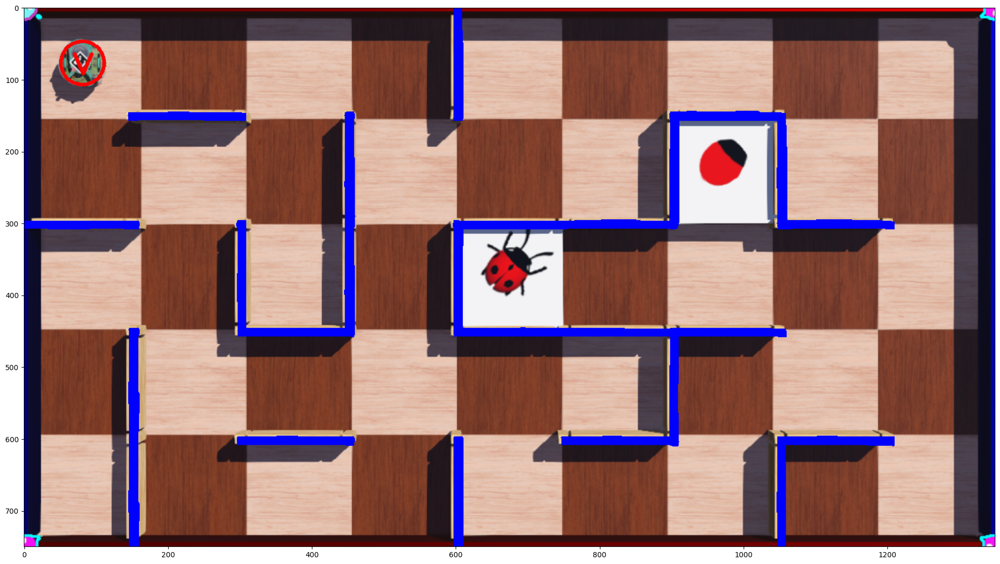

In [7]:
# Threshold the HSV map image to produce a mask for the robot
lower = np.array([35, 0, 0])
upper = np.array([88, 255, 255])
robotMask = cv2.inRange(dst_hsv, lower, upper)
# Process the robot mask to ensure only the filled robot mask remains
kernel = np.ones((2,2), np.uint8)
robotMask_erosion = cv2.erode(robotMask, kernel, iterations=2)
kernel = np.ones((5,5), np.uint8)
robotMask_dilation = cv2.dilate(robotMask_erosion, kernel, iterations=2)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(50,50))
robotMask_close = cv2.morphologyEx(robotMask_dilation, cv2.MORPH_CLOSE, kernel)

# Fill an array of both the X and Y coordinates of the robot cluster
heightIndex = 0
widthIndex = 0
robotWidth = []
robotHeight = []
while heightIndex < height:
    widthIndex = 0
    while widthIndex < width:
        if (robotMask_close[heightIndex,widthIndex] > 0):
            robotHeight.append(heightIndex)
            robotWidth.append(widthIndex)
        widthIndex += 1
    heightIndex += 1 

# Construct a 2D array of X and Y cordinates of the robot
robotHW = np.array(list(zip(robotHeight, robotWidth))).reshape(len(robotHeight), 2)
# Using a clustering method and the previous array, find the centroid of the robot
kmeans_model = KMeans(1)
K = 1
kmeans_model = KMeans(n_clusters=K).fit(robotHW)
robotCentre = np.array(kmeans_model.cluster_centers_)
# Extract the X an Y coordinates of the robot
robotCentreHeight = round(robotCentre[0][0])
robotCentreWidth = round(robotCentre[0][1])
# determine the robot's ROW location for mapping
if robotCentreHeight < 150:
    robotCellRow = 0
elif robotCentreHeight < 300:
    robotCellRow = 1
elif robotCentreHeight < 450:
    robotCellRow = 2
elif robotCentreHeight < 600:
    robotCellRow = 3
elif robotCentreHeight < 750:
    robotCellRow = 4
# determine the robot's COLUMN location for mapping
if robotCentreWidth < 150:
    robotCellCol = 0
elif robotCentreWidth < 300:
    robotCellCol = 1
elif robotCentreWidth < 450:
    robotCellCol = 2
elif robotCentreWidth < 600:
    robotCellCol = 3
elif robotCentreWidth < 750:
    robotCellCol = 4
elif robotCentreWidth < 900:
    robotCellCol = 5
elif robotCentreWidth < 1050:
    robotCellCol = 6
elif robotCentreWidth < 1200:
    robotCellCol = 7
elif robotCentreWidth < 1350:
    robotCellCol = 8
print('robotCellRow',robotCellRow)
print('robotCellCol',robotCellCol)

# Draw a circle around the robot on the RGB map image
img_rgb = cv2.circle(dstEdgeFillWallMask_rgb,(robotCentreWidth, robotCentreHeight), 30, (255,0,0),3)

# Use aruco marker to detect heading
dictionary = cv2.aruco.Dictionary_get(cv2.aruco.DICT_6X6_250)
parameters = cv2.aruco.DetectorParameters_create()
corners, markerIds, rejectedCandidates = cv2.aruco.detectMarkers(robotRGB, dictionary, parameters = parameters)
cv2.aruco.drawDetectedMarkers(robotRGB, corners, markerIds)

# Find the leading corner which is the heading of the robot
headingCorner = corners[0][0][0]
headingCornerX = int(corners[0][0][0][0])
headingCornerY = int(corners[0][0][0][1])

font = cv2.FONT_HERSHEY_SIMPLEX
# Check which direction the leading corner is leading to determine the heading of the robot
heading = '\0'
if flipMap == 0:
    if ((headingCornerX < int(corners[0][0][1][0]))
        and (headingCornerX < int(corners[0][0][2][0]))
        and (headingCornerX < int(corners[0][0][3][0]))):
        heading = 'W'
        cv2.putText(img_rgb, '<', (robotCentreWidth-30,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerX > int(corners[0][0][1][0]))
        and (headingCornerX > int(corners[0][0][2][0]))
        and (headingCornerX > int(corners[0][0][3][0]))):
        heading = 'E'
        cv2.putText(img_rgb, '>', (robotCentreWidth-20,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerY < int(corners[0][0][1][1]))
        and (headingCornerY < int(corners[0][0][2][1]))
        and (headingCornerY < int(corners[0][0][3][1]))):
        heading = 'N'
        cv2.putText(img_rgb, '^', (robotCentreWidth-20,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerY > int(corners[0][0][1][1]))
        and (headingCornerY > int(corners[0][0][2][1]))
        and (headingCornerY > int(corners[0][0][3][1]))):
        heading = 'S'
        cv2.putText(img_rgb, 'v', (robotCentreWidth-15,robotCentreHeight+15), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
# if the map required a flip in its perspective transform, then flip heading       
if flipMap == 1:
    if ((headingCornerX < int(corners[0][0][1][0]))
        and (headingCornerX < int(corners[0][0][2][0]))
        and (headingCornerX < int(corners[0][0][3][0]))):
        heading = 'E'
        cv2.putText(img_rgb, '>', (robotCentreWidth-20,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerX > int(corners[0][0][1][0]))
        and (headingCornerX > int(corners[0][0][2][0]))
        and (headingCornerX > int(corners[0][0][3][0]))):
        heading = 'W'
        cv2.putText(img_rgb, '<', (robotCentreWidth-30,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerY < int(corners[0][0][1][1]))
        and (headingCornerY < int(corners[0][0][2][1]))
        and (headingCornerY < int(corners[0][0][3][1]))):
        heading = 'S'
        cv2.putText(img_rgb, 'v', (robotCentreWidth-15,robotCentreHeight+15), font, 2, (255, 0, 0), 3, cv2.LINE_AA)
    elif ((headingCornerY > int(corners[0][0][1][1]))
        and (headingCornerY > int(corners[0][0][2][1]))
        and (headingCornerY > int(corners[0][0][3][1]))):
        heading = 'N'
        cv2.putText(img_rgb, '^', (robotCentreWidth-20,robotCentreHeight+18), font, 2, (255, 0, 0), 3, cv2.LINE_AA)

plt.figure(figsize = (75, 13.5))
plt.imshow(img_rgb)
plt.show()


TASK 6: Detect Position of the Target

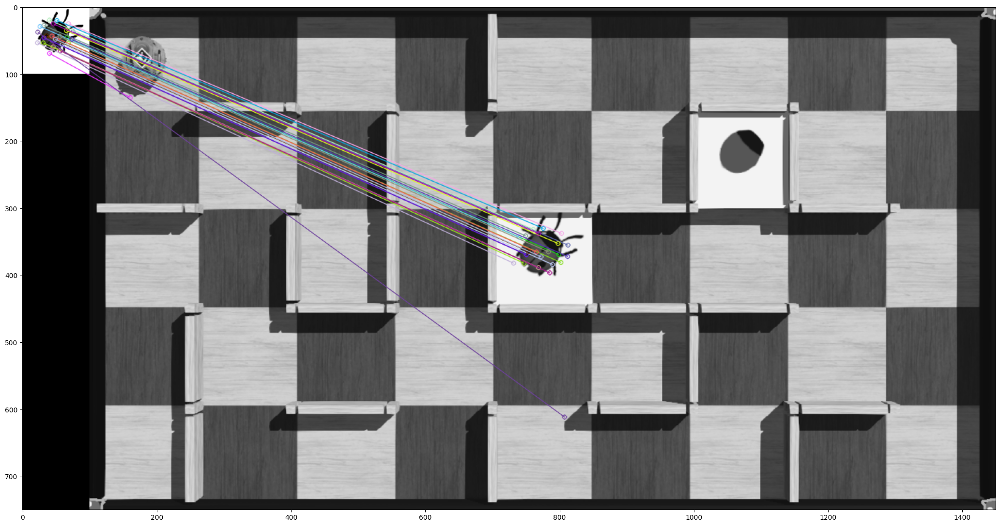

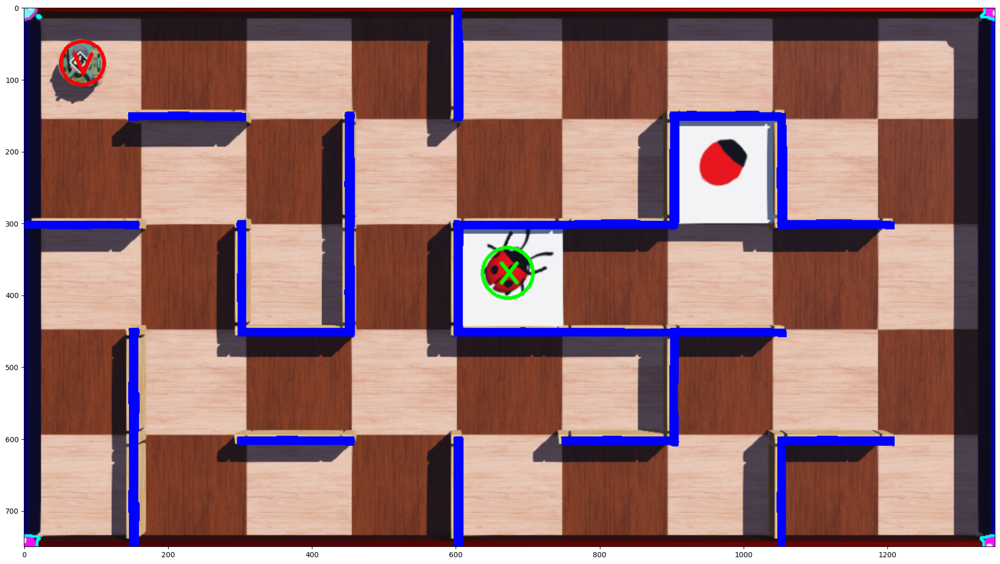

In [8]:
# Convert the target image from BGR to GRAY
targetBGR = cv2.imread(IMAGE_LADYBUG_FILE_NAME)
targetGray = cv2.cvtColor(targetBGR,cv2.COLOR_BGR2GRAY)

# Convert the map image from RGB to GRAY
dst_BGR = cv2.cvtColor(dst,cv2.COLOR_RGB2BGR)
dst_gray = cv2.cvtColor(dst_BGR,cv2.COLOR_BGR2GRAY)

# Adapted from OpenCV Documentation
# available at https://docs.opencv.org/master/dc/dc3/tutorial_py_matcher.html

# Initiate SURF detector
surf  = cv2.xfeatures2d.SURF_create()
# Find the keypoints and descriptors with SURF
kp1Surf, des1Surf = surf.detectAndCompute(targetGray, None)
kp2Surf, des2Surf = surf.detectAndCompute(dst_gray, None)
surf.setUpright(True)
# Recompute the feature points and draw it
kp1Surf = surf.detect(targetGray,None)
kp2Surf = surf.detect(dst_gray,None)
surf.setExtended(True)
kp1, des1 = surf.detectAndCompute(targetGray,None)
kp2, des2 = surf.detectAndCompute(dst_gray,None)
# BFMatcher with default params
bfSurf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=False)
matchesSurf = bfSurf.knnMatch(des1,des2,k=2)
# Apply ratio test
good = []
for m,n in matchesSurf:
    if m.distance < 0.75*n.distance:
        good.append([m])
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(targetGray,kp1,dst_gray,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize = (75, 13.5))
plt.imshow(img3),plt.show()

# Extract the matches positions on the maze
matchPoints = []
counter = 0
for match in good:
    matchPoints.append(kp2[match[0].trainIdx].pt)
# Extract the X and Y coordinates of these points on the maze
matchPointsX = []
matchPointsY = []
counter = 0
while counter < len(matchPoints):
    matchXY = matchPoints[counter]
    x = matchXY[0]
    y = matchXY[1]
    matchPointsX.append(int(x))
    matchPointsY.append(int(y))
    counter += 1

matchPointsXSaved = matchPointsX
matchPointsYSaved = matchPointsY

# Modified from Renu Khandelwal's code on DataDrivenInvestor
# available at https://medium.datadriveninvestor.com/finding-outliers-in-dataset-using-python-efc3fce6ce32
def detect_outlier(data):
    threshold = 1
    mean = np.mean(data)
    std =np.std(data)
    for idx, y in enumerate(data):
        z_score= (y - mean)/std
        if np.abs(z_score) > threshold:
            outliers.append(y)
            outlierIndex.append(idx)
    return outlierIndex,outliers

# Find the outliers of the matches
outliers = []
outlierIndex = []
outlierIndex, outliers = detect_outlier(matchPointsY)
outlierIndex, outliers = detect_outlier(matchPointsX)
outlierIndex = list(dict.fromkeys(outlierIndex))
outlierIndex.sort()
if len(outlierIndex) == len(matchPointsY):
    outlierIndex = []
# Remove the outliers from the matches if they exist
if len(outlierIndex) > 0:
    counter = 0
    while counter < len(outlierIndex):
        matchPointsX.pop(outlierIndex[counter] - counter)
        matchPointsY.pop(outlierIndex[counter] - counter)
        counter += 1

# Set up a 2D array of X-Y coordinates of the target matches
targetHW = np.array(list(zip(matchPointsY, matchPointsX))).reshape(len(matchPointsY), 2)
# Use clustering to find the centroid of the target from the match points
kmeans_model = KMeans(1)
K = 1
kmeans_model = KMeans(n_clusters=K).fit(targetHW)
targetCentre = kmeans_model.cluster_centers_
targetCentreX = int(targetCentre[0][1])
targetCentreY = int(targetCentre[0][0])

# Determine the ROW coordinate of the target for mapping
if targetCentreY < 150:
    targetCellRow = 0
elif targetCentreY < 300:
    targetCellRow = 1
elif targetCentreY < 450:
    targetCellRow = 2
elif targetCentreY < 600:
    targetCellRow = 3
elif targetCentreY < 750:
    targetCellRow = 4
# Determine the COLUMN coordinate of the target for mapping
if targetCentreX < 150:
    targetCellCol = 0
elif targetCentreX < 300:
    targetCellCol = 1
elif targetCentreX < 450:
    targetCellCol = 2
elif targetCentreX < 600:
    targetCellCol = 3
elif targetCentreX < 750:
    targetCellCol = 4
elif targetCentreX < 900:
    targetCellCol = 5
elif targetCentreX < 1050:
    targetCellCol = 6
elif targetCentreX < 1200:
    targetCellCol = 7
elif targetCentreX < 1350:
    targetCellCol = 8

# Draw the target marker on the RGB maze
font = cv2.FONT_HERSHEY_SIMPLEX
img_rgb = cv2.circle(img_rgb,(targetCentreX,targetCentreY+6), 35, (0,255,0),3)
cv2.putText(img_rgb, 'x', (targetCentreX-15,targetCentreY+20), font, 2, (0,255,0), 3, cv2.LINE_AA)
plt.figure(figsize = (75, 13.5))
plt.imshow(img_rgb)
plt.show()

TASK 7: Generate a Map and Write it to a .txt file

In [9]:

MapFile = open(MAP_FILE_NAME ,"w")
mapStringRows = 11
mapStringCols = 37
mapRows = 5
mapCols = 9

rowIndex = 0
rowStringIndex = 0
while rowStringIndex < mapStringRows:
    rowString = ""
    colIndex = 0
    colStringIndex = 0
    while colStringIndex < mapStringCols:
        
        if rowStringIndex  % 2 == 0: # horizontal walls
            
            while colIndex < mapCols:
                if hWalls[rowIndex][colIndex] == 1:
                    rowString += " ---"
                else:
                    rowString += "    "
                colIndex += 1
            rowString += " "    
            colStringIndex += 37
            
        elif rowStringIndex  % 2 > 0: # vertical walls, target, and robot
            
            while colIndex < mapCols:
                if vWalls[rowIndex][colIndex] == 1:
                    if rowIndex == targetCellRow and colIndex == targetCellCol:
                        rowString += "| x "
                    elif rowIndex == robotCellRow and colIndex == robotCellCol:
                        if heading == 'N':
                            rowString += "| ^ "
                        if heading == 'S':
                            rowString += "| v "
                        if heading == 'E':
                            rowString += "| > "
                        if heading == 'W':
                            rowString += "| < "
                    else:
                        rowString += "|   "
                    
                if vWalls[rowIndex][colIndex] == 0:
                    if rowIndex == targetCellRow and colIndex == targetCellCol:
                        rowString += "  x "
                    elif rowIndex == robotCellRow and colIndex == robotCellCol:
                        if heading == 'N':
                            rowString += "  ^ "
                        if heading == 'S':
                            rowString += "  v "
                        if heading == 'E':
                            rowString += "  > "
                        if heading == 'W':
                            rowString += "  < "
                    else:
                        rowString += "    "                         
                
                colIndex += 1
                
            if vWalls[rowIndex][colIndex] == 1:
                    rowString += "|"
                    
            colStringIndex += 37
                
            rowIndex += 1   
        
    rowStringIndex += 1
    if rowIndex < mapRows+1:
        rowString += "\n"
    MapFile.write(rowString)    

MapFile.close()

with open(MAP_FILE_NAME, 'r') as map:
    print(map.read())
MapFile.close()      



 --- --- --- --- --- --- --- --- --- 
| v             |                   |
     ---                 ---         
|           |           |   |       |
 ---             --- ---     ---     
|       |   |   | x                 |
         ---     --- --- ---         
|   |                   |           |
         ---         ---     ---     
|   |           |           |       |
 --- --- --- --- --- --- --- --- --- 

